In [3]:
!pip install czifile

In [3]:
from nd2tif.transform import to_8bits
from czifile import imread

In [4]:
from nd2_combine import tools
from segment import seg
from droplet_growth import multiwell
from glob import glob
import matplotlib.pyplot as plt
import numpy as np
import logging
import os
import math
import pandas as pd
import re
from skimage.morphology import convex_hull_image
from skimage.transform import rotate
from scipy.ndimage import gaussian_filter1d as gf
from scipy.interpolate import interp1d
import seaborn as sns
import json
import re
logging.basicConfig(level=logging.DEBUG)

logger = logging.getLogger()
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
def segment_bf(well, thr=0.2, smooth=10, erode=10, fill=True, plot=False):
    '''
    Serments input 2d array using thresholded gradient with filling
    Returns SegmentedImage object
    '''
    grad = multiwell.get_2d_gradient(well)
    sm = multiwell.gaussian_filter(grad, smooth)
#     sm = multiwell.gaussian_filter(well, smooth)
    
    regions = sm > thr * sm.max()
    
    if fill:
        regions = multiwell.binary_fill_holes(regions)
    
    if erode:
        regions = multiwell.binary_erosion(regions, iterations=erode)
    
    labels, n_labels = multiwell.label(regions)
    print(f'{n_labels} regions')
    if plot:
        fig, ax = multiwell.plt.subplots(1,2)
        ax[0].imshow(sm, cmap='gray')
        ax[1].imshow(labels)
        plt.show()
        
    return labels


In [6]:
def read_czi(path, channels:list = ['BF', 'TRITC', 'FITC'], plot=1) -> dict:
    stack = imread(path)[0,1:,:,:,0]
    stack8 = to_8bits(stack)
    print(path)
    print(stack.shape)
    rgb = np.stack([*stack8, np.zeros_like(stack8[0])], axis=-1)
    if plot:
        plt.imshow(rgb)
        plt.show()
    return {'path': path, 'stack': stack, 'rgb': rgb}

In [160]:
def subsample_intensity_profile(values, n_samples=20, sigma=10, plot=False):
    '''
    Subsamples 1D curve.
    1. Cut off zero values
    2. Smooth with `sigma`
    3. Intepolate using vector with `n_samples` spots
    
    Return:
    -------
    Subsampled values
    '''
    r_profile = np.array(values, 'float')
    rf_profile = r_profile[r_profile > 0]
    rfs_profile = gf(rf_profile, sigma)
    full_vector = np.arange(len(rfs_profile))
    approx = interp1d(full_vector, rfs_profile)
    vector = np.linspace(0, len(rfs_profile)-1, n_samples, endpoint=True)
    subsample = approx(vector)
    
    if plot:
        plt.plot(rf_profile)
        plt.plot(rfs_profile)
        plt.plot(vector, subsample, '.r')
        plt.show()
    return subsample

def orient(curve):
    curve = curve / curve.max()
    mid = len(curve) // 2
    if curve.argmax() < mid:
        return curve[::-1]
    else:
        return curve
    
def process_2_colors(stack:dict, min_size=50, bins=20, staining=['TRITC', 'FITC'], plot=True, **kwargs):
    path, stack, rgb = stack.values()
    tritc, fitc = stack
    print('fitc')
    labels = segment_bf(fitc, thr=.4, plot=plot)
    props = multiwell.regionprops(labels)
    filtered_props = list(filter(lambda p: p.major_axis_length > min_size, props))
    print(f'{len(filtered_props)} regions after filtering using min size {min_size}')
    
    datas = []
    for ind, prop in enumerate(filtered_props):
        mask = labels == prop.label
        good_mask = convex_hull_image(mask).astype(int)
        if plot:
            plt.imshow(good_mask)
            plt.title('Convex area')
            plt.show()
        
        I_tritc = multiwell.regionprops(good_mask, intensity_image=tritc)[0].mean_intensity
        I_fitc = multiwell.regionprops(good_mask, intensity_image=fitc)[0].mean_intensity
        
        convex_prop = multiwell.regionprops(good_mask)[0]
        
        data = {'path': path, 
                'size_px': prop.major_axis_length,
                'area': prop.area,
                'perimeter': prop.perimeter,
                'circularity': prop.area / (prop.perimeter ** 2),
                'convex_area': convex_prop.area,
                'convex_eccentricity': convex_prop.eccentricity,
                'convex_perimeter': convex_prop.perimeter,
                'convex_circularity': convex_prop.area / (convex_prop.perimeter ** 2),
                'convex_eccentricity': convex_prop.eccentricity,
                'tritc': I_tritc,
                'fitc': I_fitc,
                'index': ind, 
                **kwargs
        }
        datas.append(data)
    df = pd.DataFrame(datas)
    return df

In [77]:
fluo_path = r'../data-Seb/Neurons/96-wells_2/*/*.czi'
flist = glob(fluo_path)
list(map(re.compile('(\d\dh).*_10X_(\d*)-(w\d*)').findall, flist))

[[('24h', '1000', 'w1')],
 [('24h', '1000', 'w10')],
 [('24h', '1000', 'w11')],
 [('24h', '1000', 'w12')],
 [('24h', '1000', 'w13')],
 [('24h', '1000', 'w14')],
 [('24h', '1000', 'w15')],
 [('24h', '1000', 'w16')],
 [('24h', '1000', 'w17')],
 [('24h', '1000', 'w18')],
 [('24h', '1000', 'w2')],
 [('24h', '1000', 'w3')],
 [('24h', '1000', 'w4')],
 [('24h', '1000', 'w5')],
 [('24h', '1000', 'w6')],
 [('24h', '1000', 'w7')],
 [('24h', '1000', 'w8')],
 [('24h', '1000', 'w9')],
 [('24h', '700', 'w1')],
 [('24h', '700', 'w10')],
 [('24h', '700', 'w11')],
 [('24h', '700', 'w12')],
 [('24h', '700', 'w13')],
 [('24h', '700', 'w14')],
 [('24h', '700', 'w15')],
 [('24h', '700', 'w16')],
 [('24h', '700', 'w2')],
 [('24h', '700', 'w3')],
 [('24h', '700', 'w4')],
 [('24h', '700', 'w5')],
 [('24h', '700', 'w6')],
 [('24h', '700', 'w7')],
 [('24h', '700', 'w8')],
 [('24h', '700', 'w9')],
 [('48h', '1000', 'w1')],
 [('48h', '1000', 'w10')],
 [('48h', '1000', 'w11')],
 [('48h', '1000', 'w12')],
 [('48h',

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w1.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w1.czi
(2, 2048, 2048)


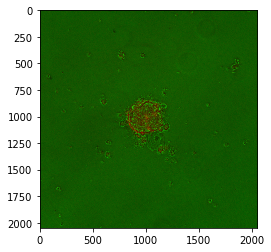

fitc
20 regions


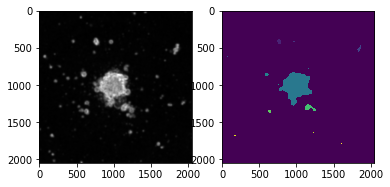

20 regions
2 regions after filtering using min size 150


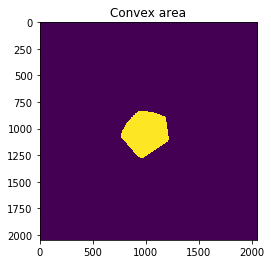

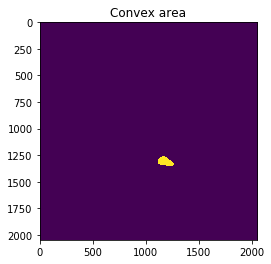

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w10.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w10.czi
(2, 2048, 2048)


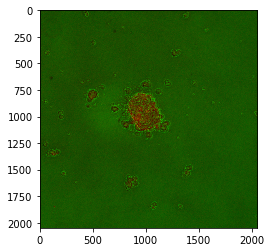

fitc
21 regions


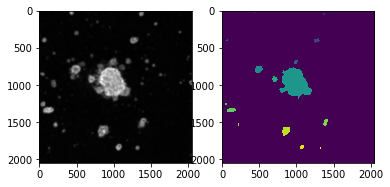

21 regions
1 regions after filtering using min size 150


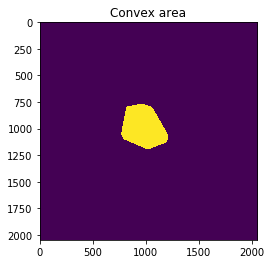

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w11.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w11.czi
(2, 2048, 2048)


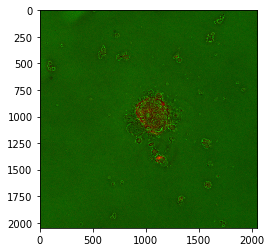

fitc
22 regions


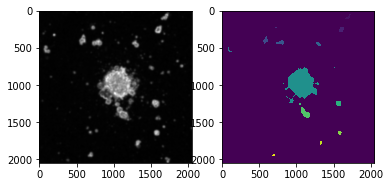

22 regions
2 regions after filtering using min size 150


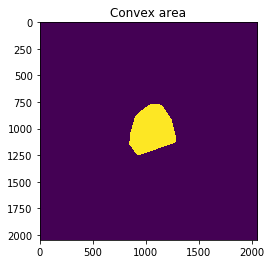

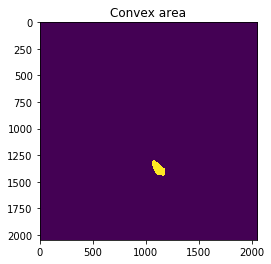

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w12.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w12.czi
(2, 2048, 2048)


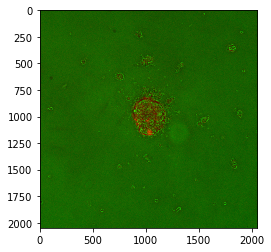

fitc
26 regions


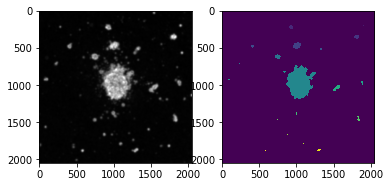

26 regions
1 regions after filtering using min size 150


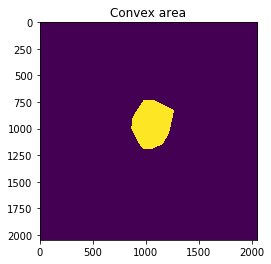

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w13.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w13.czi
(2, 2048, 2048)


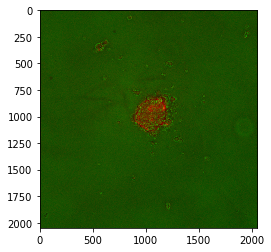

fitc
14 regions


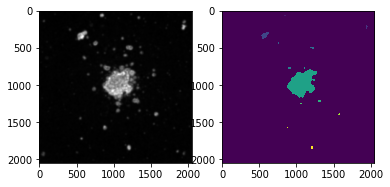

14 regions
1 regions after filtering using min size 150


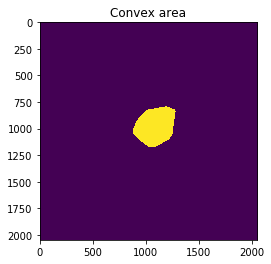

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w14.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w14.czi
(2, 2048, 2048)


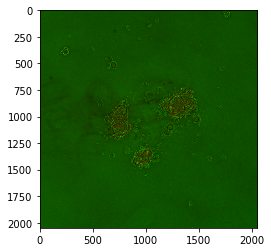

fitc
13 regions


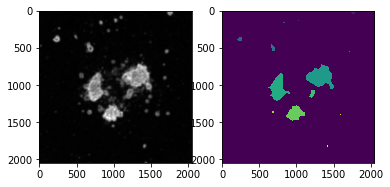

13 regions
3 regions after filtering using min size 150


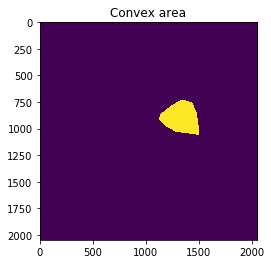

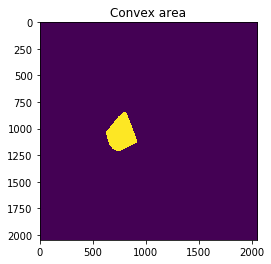

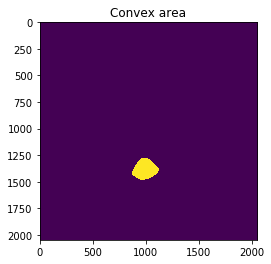

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w15.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w15.czi
(2, 2048, 2048)


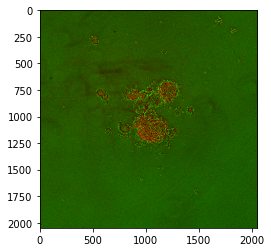

fitc
10 regions


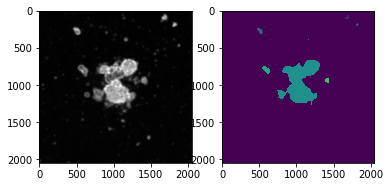

10 regions
1 regions after filtering using min size 150


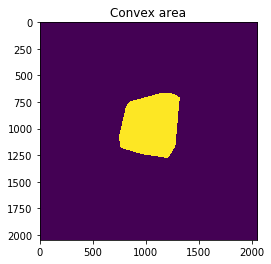

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w16.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w16.czi
(2, 2048, 2048)


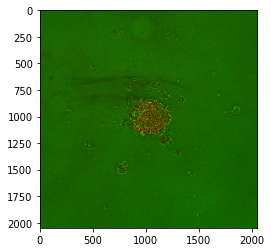

fitc
14 regions


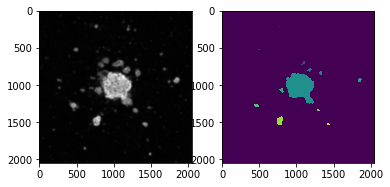

14 regions
1 regions after filtering using min size 150


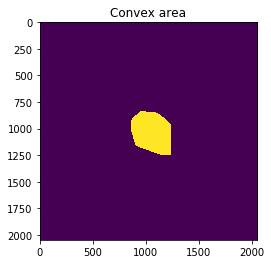

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w17.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w17.czi
(2, 2048, 2048)


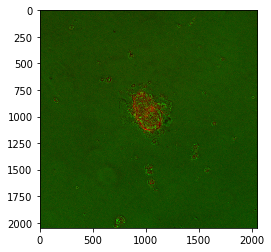

fitc
22 regions


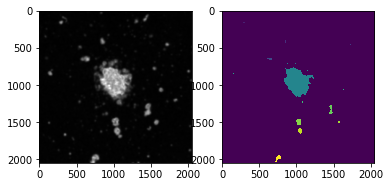

22 regions
2 regions after filtering using min size 150


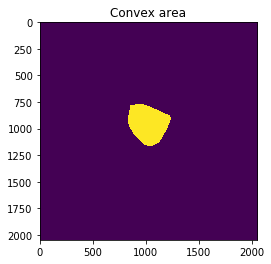

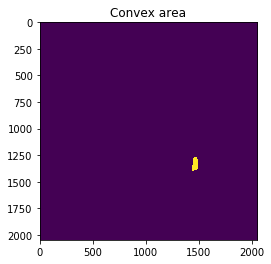

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w18.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w18.czi
(2, 2048, 2048)


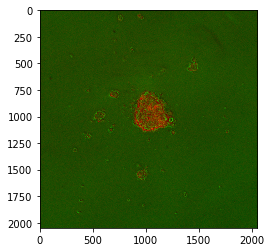

fitc
16 regions


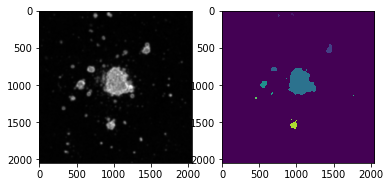

16 regions
1 regions after filtering using min size 150


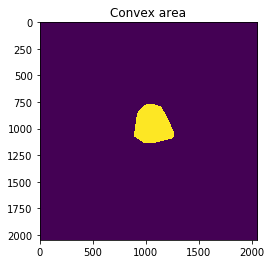

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w2.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w2.czi
(2, 2048, 2048)


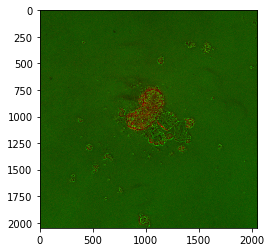

fitc
25 regions


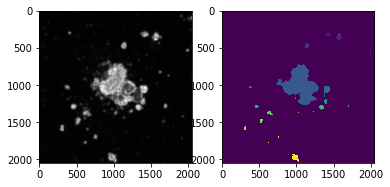

25 regions
1 regions after filtering using min size 150


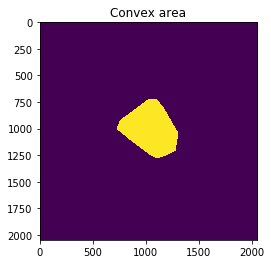

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w3.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w3.czi
(2, 2048, 2048)


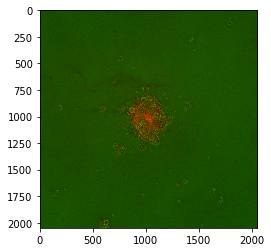

fitc
17 regions


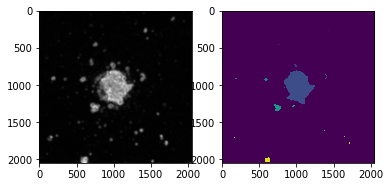

17 regions
1 regions after filtering using min size 150


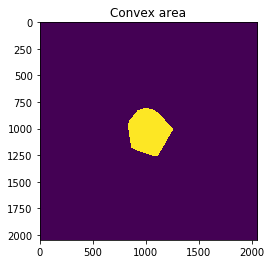

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w4.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w4.czi
(2, 2048, 2048)


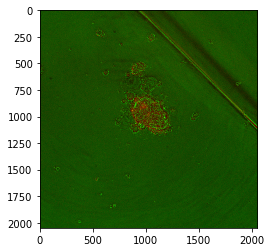

fitc
26 regions


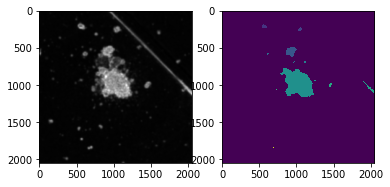

26 regions
2 regions after filtering using min size 150


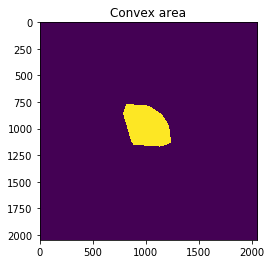

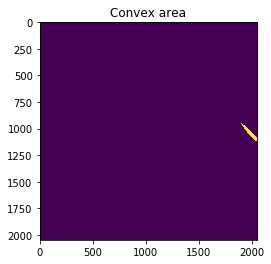

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w5.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w5.czi
(2, 2048, 2048)


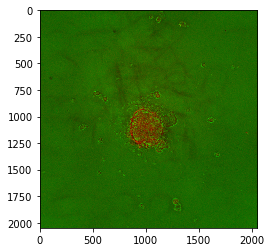

fitc
18 regions


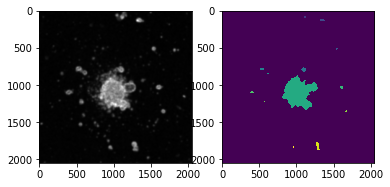

18 regions
1 regions after filtering using min size 150


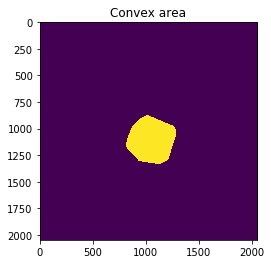

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w6.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w6.czi
(2, 2048, 2048)


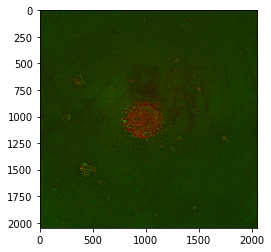

fitc
20 regions


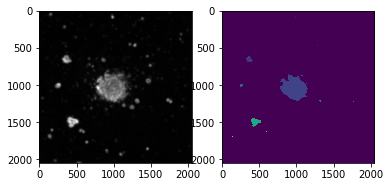

20 regions
1 regions after filtering using min size 150


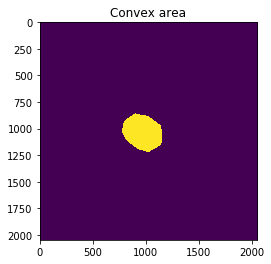

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w7.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w7.czi
(2, 2048, 2048)


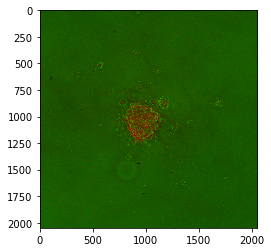

fitc
12 regions


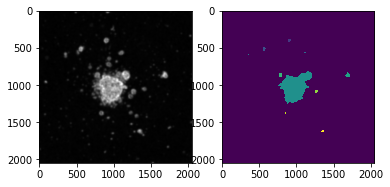

12 regions
1 regions after filtering using min size 150


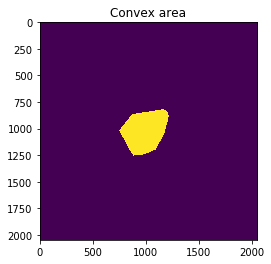

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w8.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w8.czi
(2, 2048, 2048)


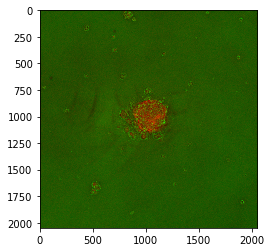

fitc
22 regions


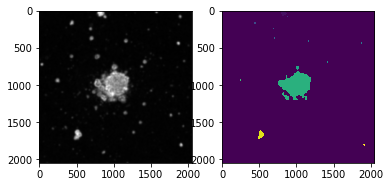

22 regions
1 regions after filtering using min size 150


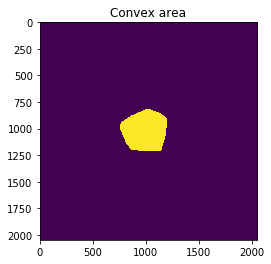

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w9.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w9.czi
(2, 2048, 2048)


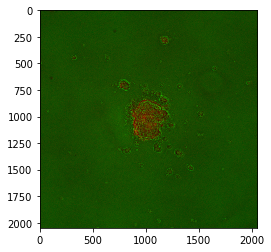

fitc
13 regions


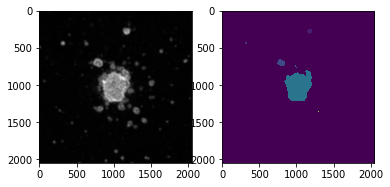

13 regions
1 regions after filtering using min size 150


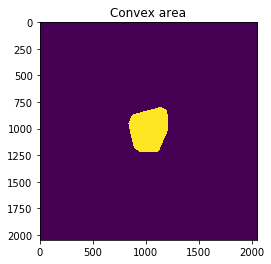

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w1.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w1.czi
(2, 2048, 2048)


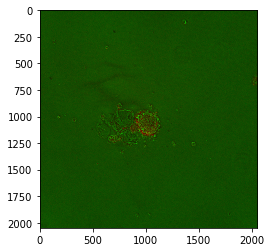

fitc
14 regions


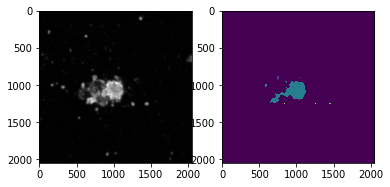

14 regions
1 regions after filtering using min size 150


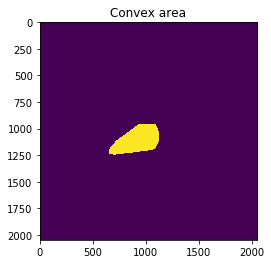

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w10.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w10.czi
(2, 2048, 2048)


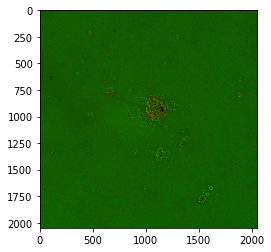

fitc
18 regions


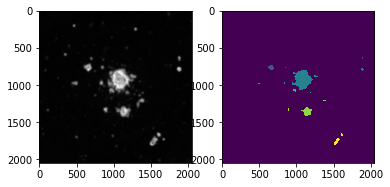

18 regions
1 regions after filtering using min size 150


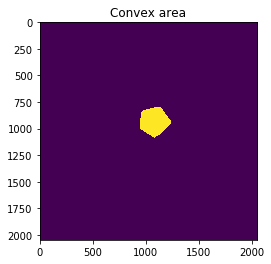

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w11.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w11.czi
(2, 2048, 2048)


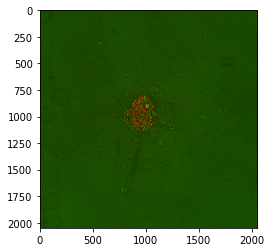

fitc
8 regions


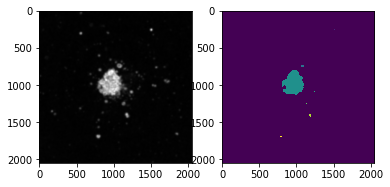

8 regions
1 regions after filtering using min size 150


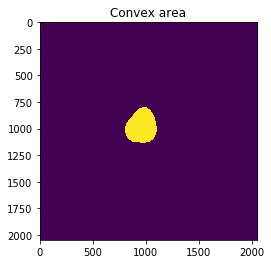

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w12.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w12.czi
(2, 2048, 2048)


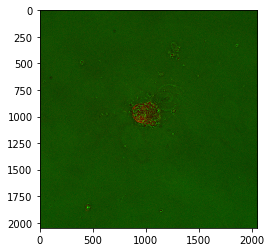

fitc
10 regions


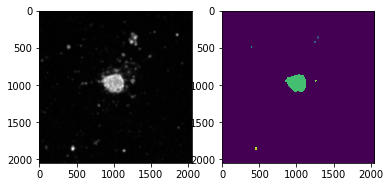

10 regions
1 regions after filtering using min size 150


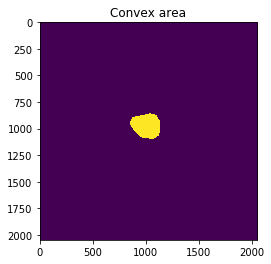

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w13.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w13.czi
(2, 2048, 2048)


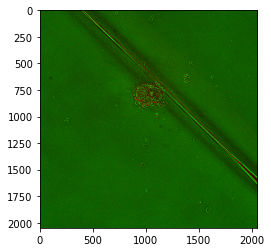

fitc
23 regions


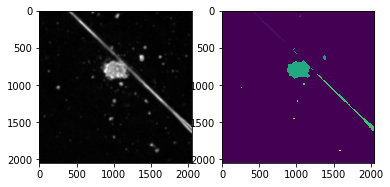

23 regions
3 regions after filtering using min size 150


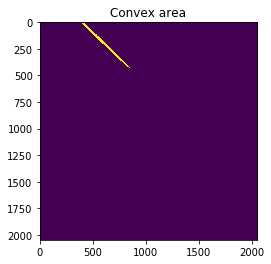

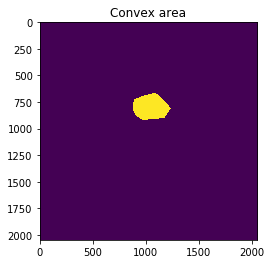

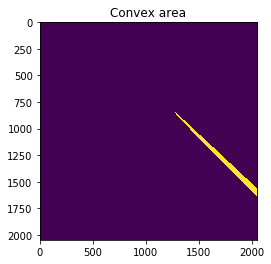

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w14.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w14.czi
(2, 2048, 2048)


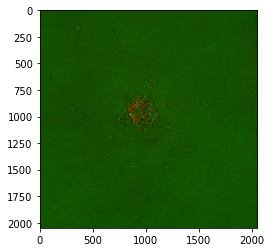

fitc
7 regions


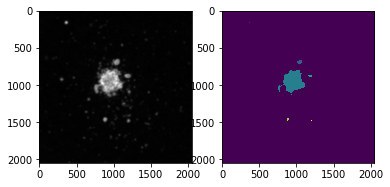

7 regions
1 regions after filtering using min size 150


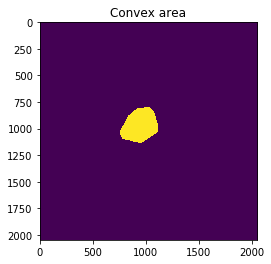

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w15.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w15.czi
(2, 2048, 2048)


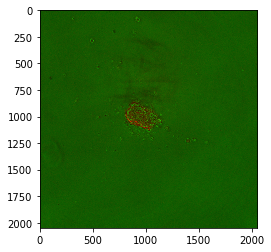

fitc
8 regions


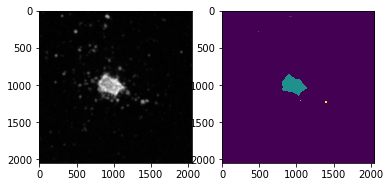

8 regions
1 regions after filtering using min size 150


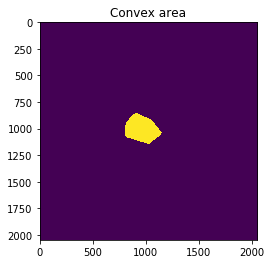

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w16.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w16.czi
(2, 2048, 2048)


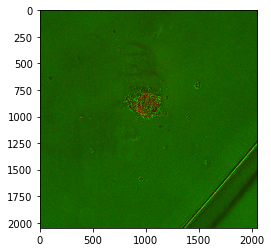

fitc
8 regions


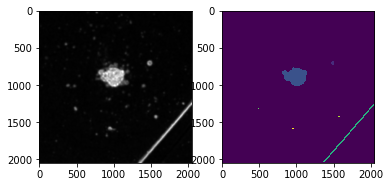

8 regions
2 regions after filtering using min size 150


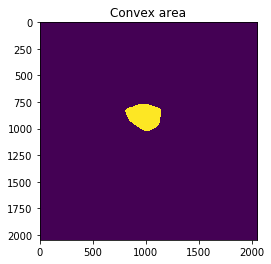

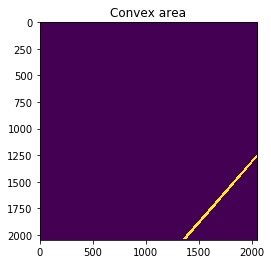

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w2.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w2.czi
(2, 2048, 2048)


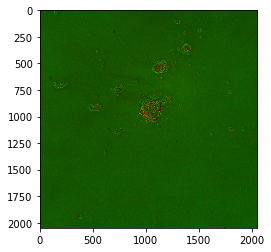

fitc
15 regions


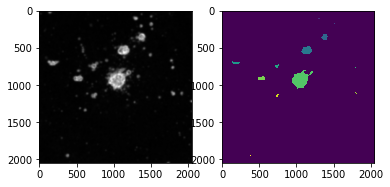

15 regions
1 regions after filtering using min size 150


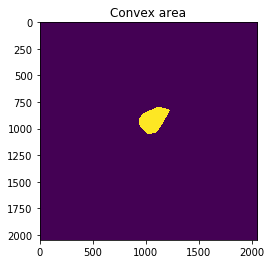

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w3.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w3.czi
(2, 2048, 2048)


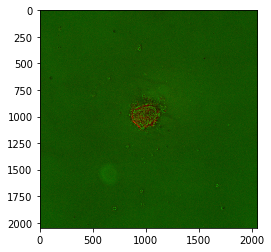

fitc
9 regions


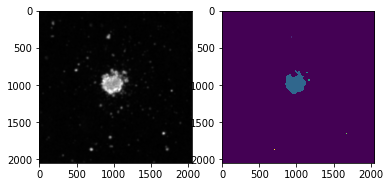

9 regions
1 regions after filtering using min size 150


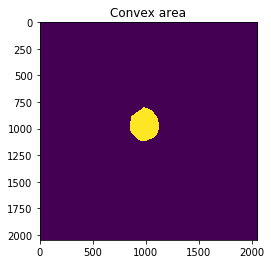

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w4.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w4.czi
(2, 2048, 2048)


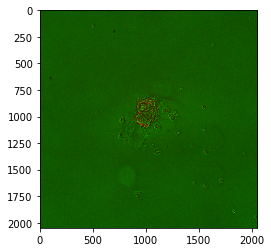

fitc
12 regions


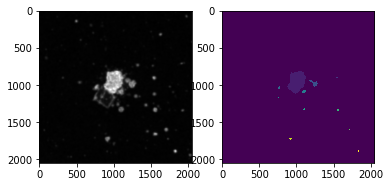

12 regions
1 regions after filtering using min size 150


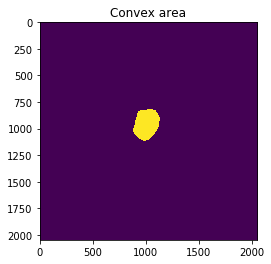

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w5.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w5.czi
(2, 2048, 2048)


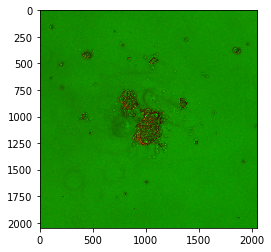

fitc
22 regions


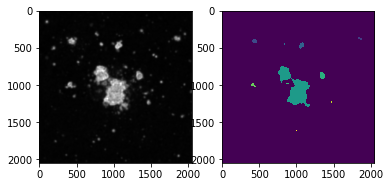

22 regions
1 regions after filtering using min size 150


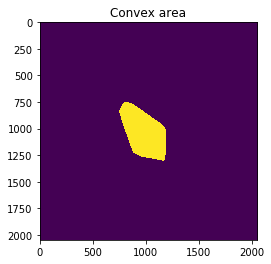

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w6.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w6.czi
(2, 2048, 2048)


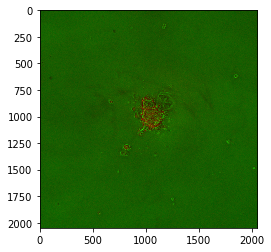

fitc
9 regions


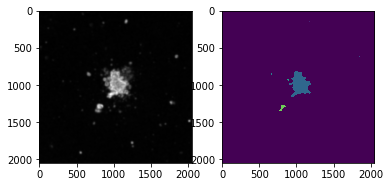

9 regions
1 regions after filtering using min size 150


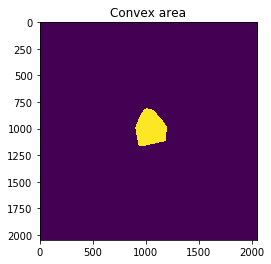

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w7.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w7.czi
(2, 2048, 2048)


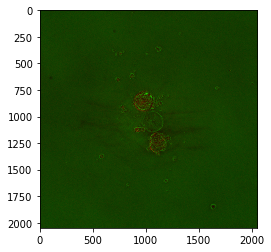

fitc
12 regions


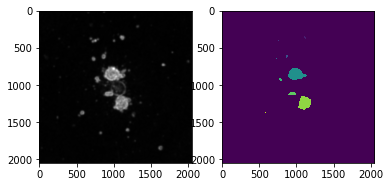

12 regions
2 regions after filtering using min size 150


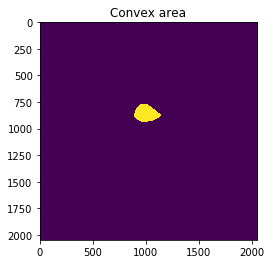

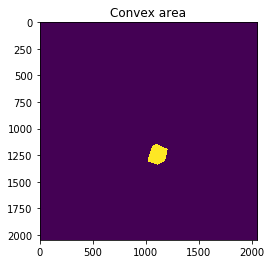

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w8.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w8.czi
(2, 2048, 2048)


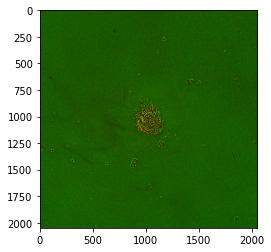

fitc
12 regions


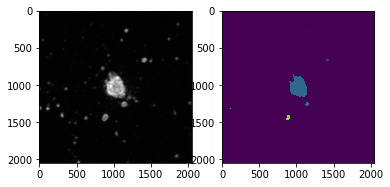

12 regions
1 regions after filtering using min size 150


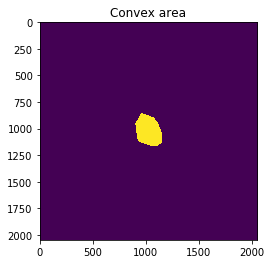

../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w9.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w9.czi
(2, 2048, 2048)


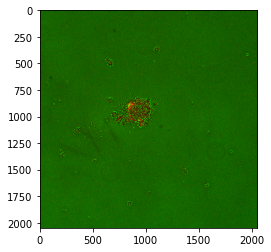

fitc
11 regions


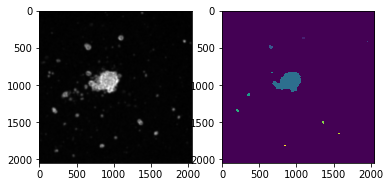

11 regions
1 regions after filtering using min size 150


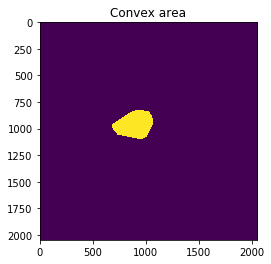

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w1.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w1.czi
(2, 2048, 2048)


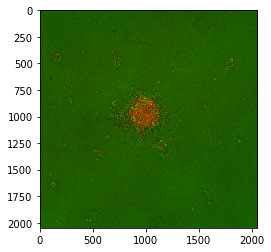

fitc
17 regions


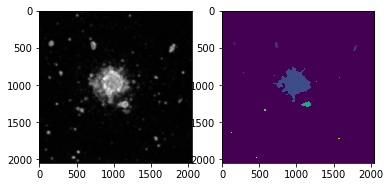

17 regions
1 regions after filtering using min size 150


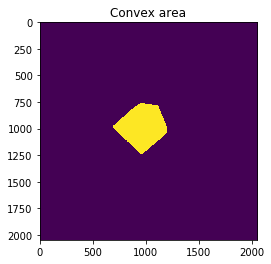

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w10.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w10.czi
(2, 2048, 2048)


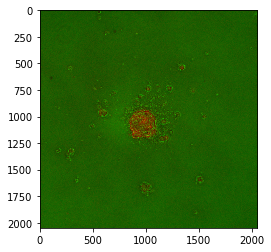

fitc
25 regions


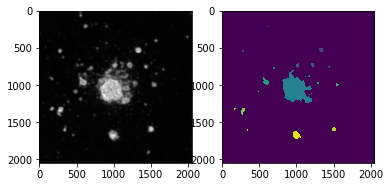

25 regions
1 regions after filtering using min size 150


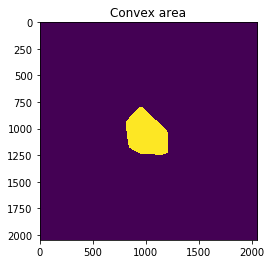

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w11.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w11.czi
(2, 2048, 2048)


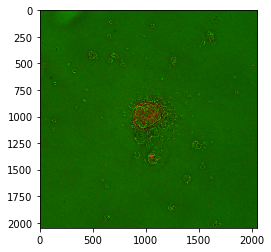

fitc
32 regions


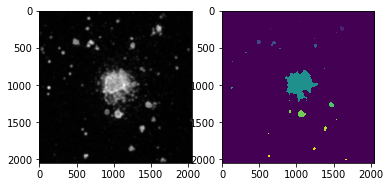

32 regions
1 regions after filtering using min size 150


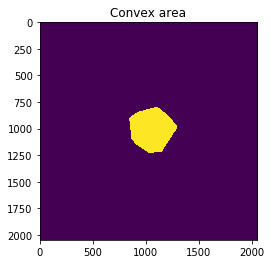

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w12.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w12.czi
(2, 2048, 2048)


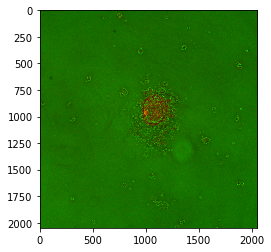

fitc
30 regions


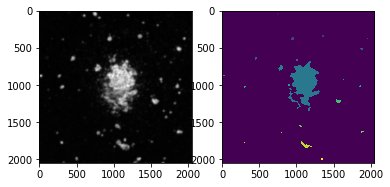

30 regions
2 regions after filtering using min size 150


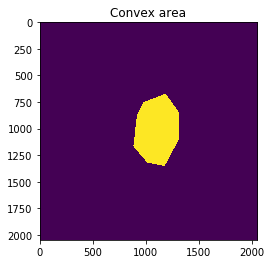

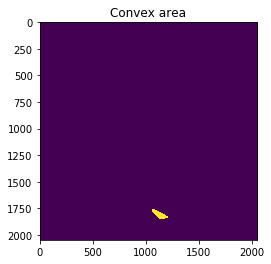

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w13.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w13.czi
(2, 2048, 2048)


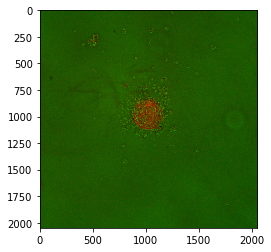

fitc
20 regions


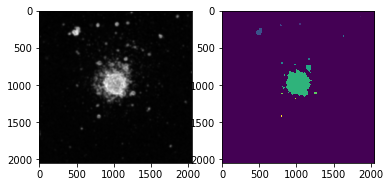

20 regions
1 regions after filtering using min size 150


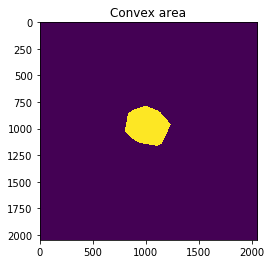

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w14.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w14.czi
(2, 2048, 2048)


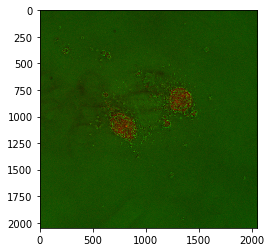

fitc
21 regions


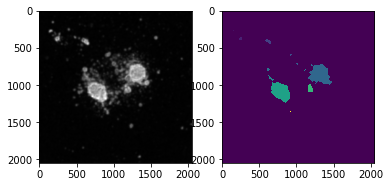

21 regions
2 regions after filtering using min size 150


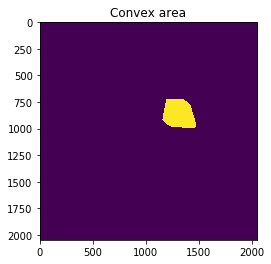

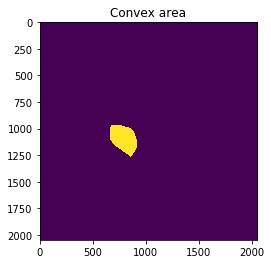

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w15.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w15.czi
(2, 2048, 2048)


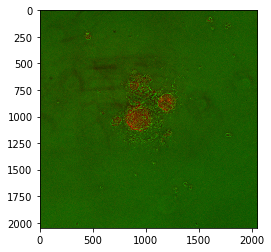

fitc
15 regions


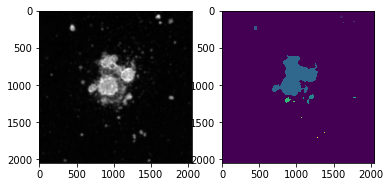

15 regions
2 regions after filtering using min size 150


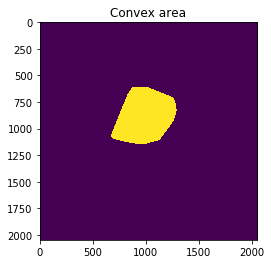

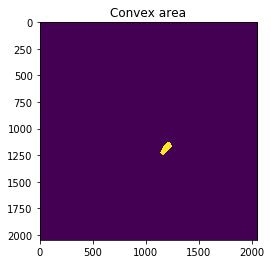

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w16.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w16.czi
(2, 2048, 2048)


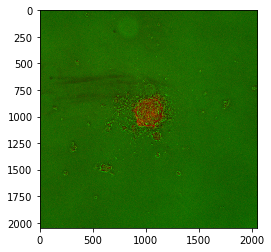

fitc
17 regions


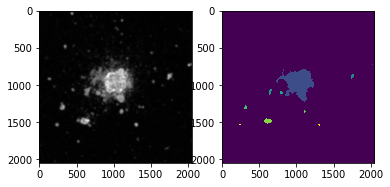

17 regions
1 regions after filtering using min size 150


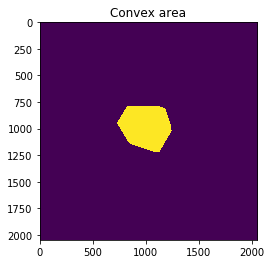

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w17.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w17.czi
(2, 2048, 2048)


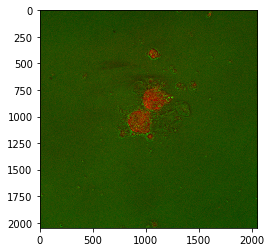

fitc
6 regions


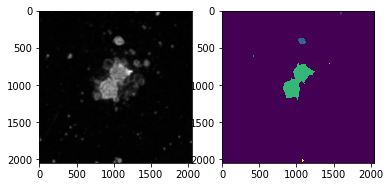

6 regions
1 regions after filtering using min size 150


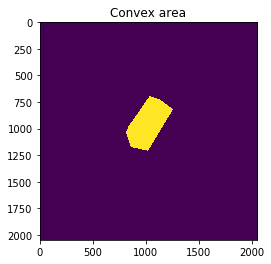

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w2.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w2.czi
(2, 2048, 2048)


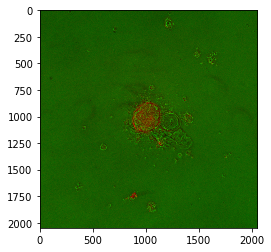

fitc
18 regions


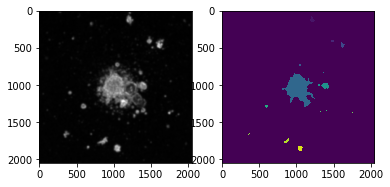

18 regions
1 regions after filtering using min size 150


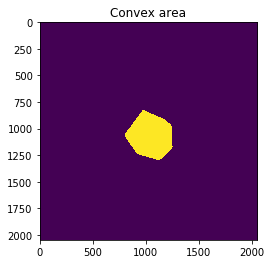

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w3.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w3.czi
(2, 2048, 2048)


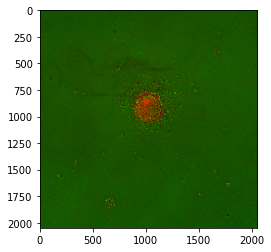

fitc
17 regions


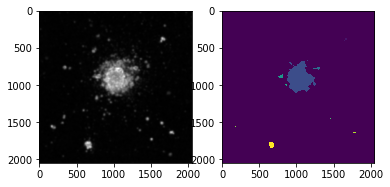

17 regions
1 regions after filtering using min size 150


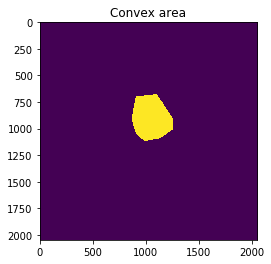

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w4.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w4.czi
(2, 2048, 2048)


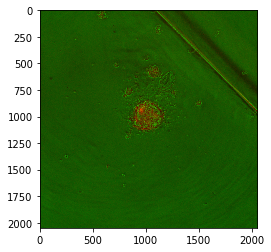

fitc
60 regions


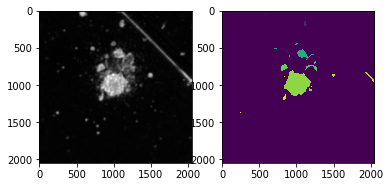

60 regions
4 regions after filtering using min size 150


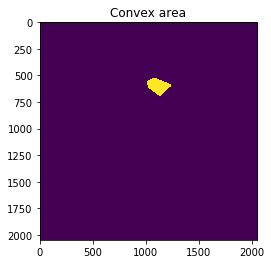

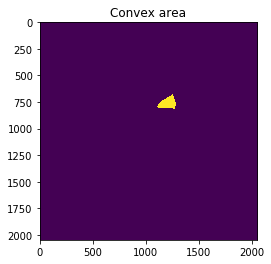

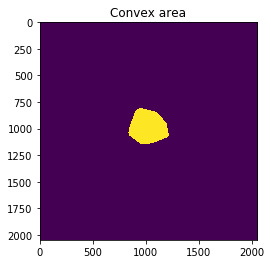

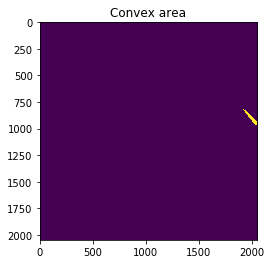

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w5.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w5.czi
(2, 2048, 2048)


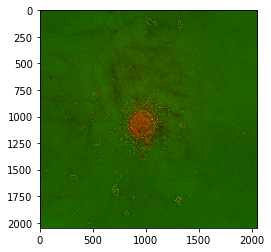

fitc
20 regions


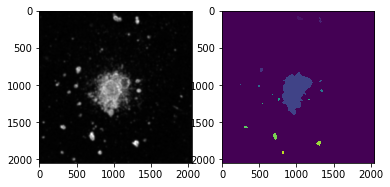

20 regions
1 regions after filtering using min size 150


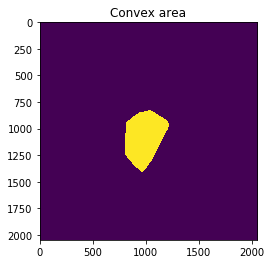

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w6.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w6.czi
(2, 2048, 2048)


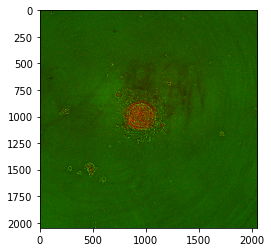

fitc
18 regions


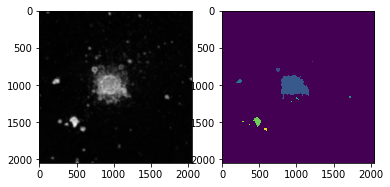

18 regions
1 regions after filtering using min size 150


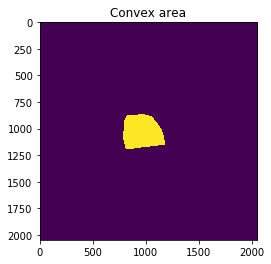

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w7.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w7.czi
(2, 2048, 2048)


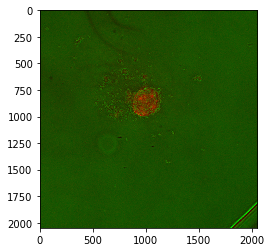

fitc
8 regions


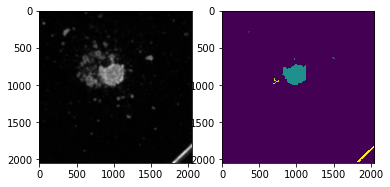

8 regions
2 regions after filtering using min size 150


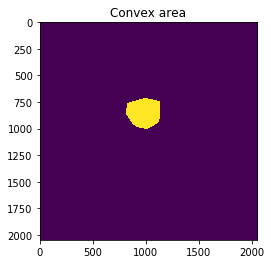

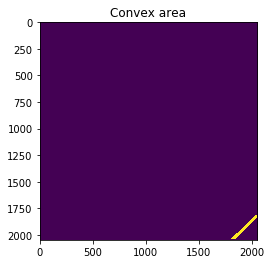

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w8.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w8.czi
(2, 2048, 2048)


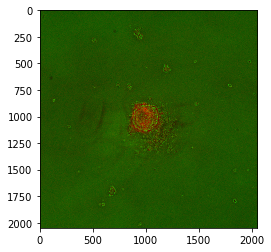

fitc
14 regions


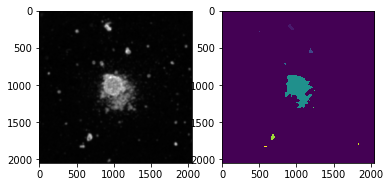

14 regions
1 regions after filtering using min size 150


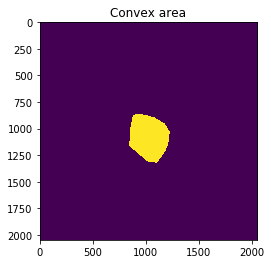

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w9.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w9.czi
(2, 2048, 2048)


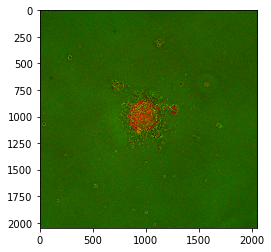

fitc
18 regions


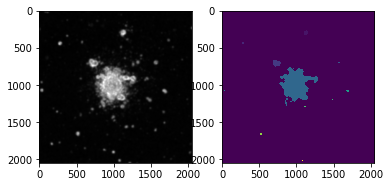

18 regions
1 regions after filtering using min size 150


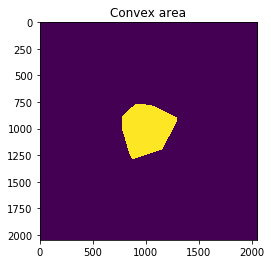

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w1.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w1.czi
(2, 2048, 2048)


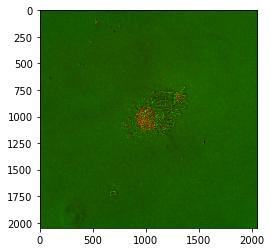

fitc
15 regions


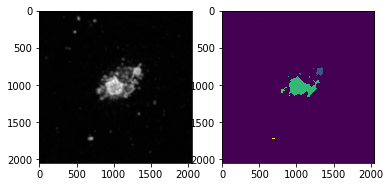

15 regions
1 regions after filtering using min size 150


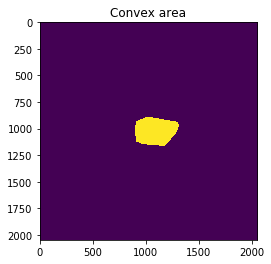

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w10.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w10.czi
(2, 2048, 2048)


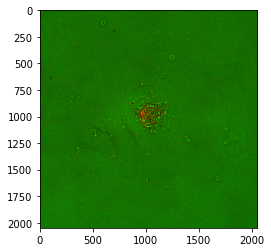

fitc
15 regions


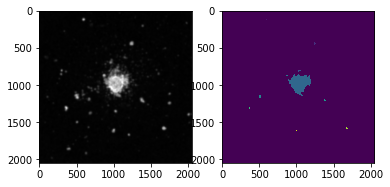

15 regions
1 regions after filtering using min size 150


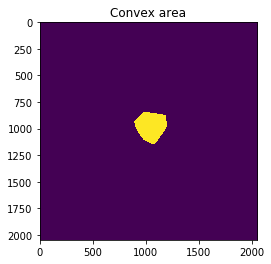

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w11.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w11.czi
(2, 2048, 2048)


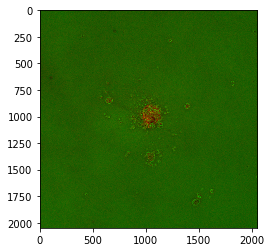

fitc
16 regions


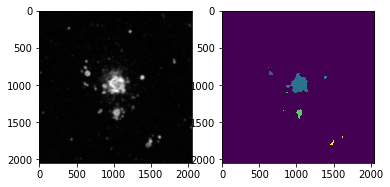

16 regions
1 regions after filtering using min size 150


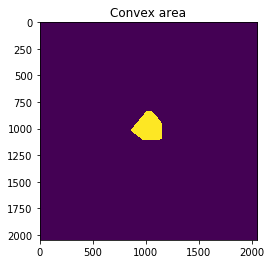

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w12.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w12.czi
(2, 2048, 2048)


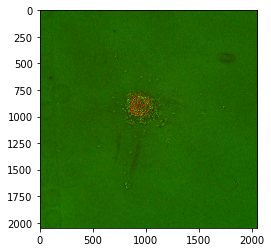

fitc
6 regions


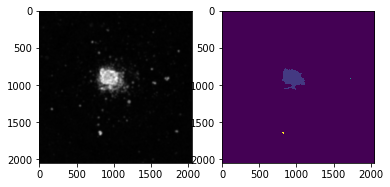

6 regions
1 regions after filtering using min size 150


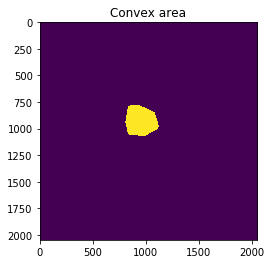

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w13.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w13.czi
(2, 2048, 2048)


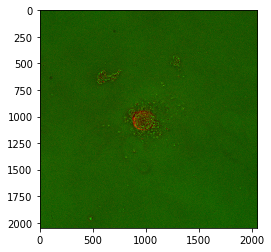

fitc
11 regions


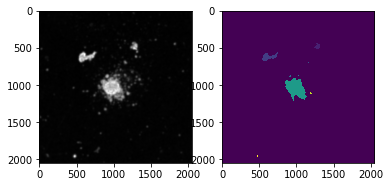

11 regions
2 regions after filtering using min size 150


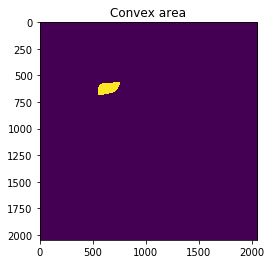

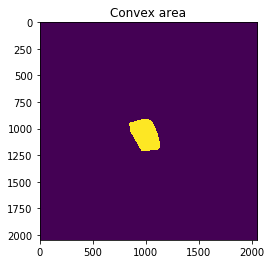

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w14.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w14.czi
(2, 2048, 2048)


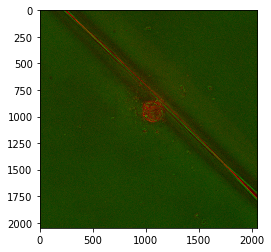

fitc
16 regions


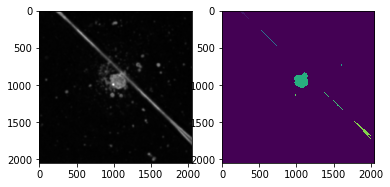

16 regions
5 regions after filtering using min size 150


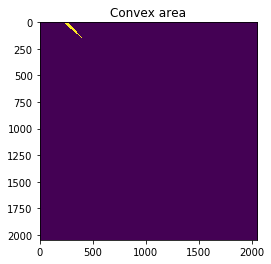

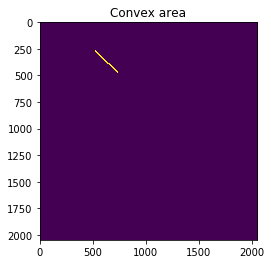

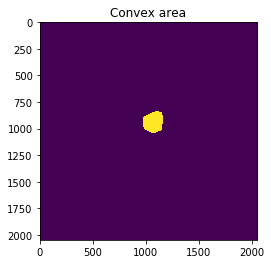

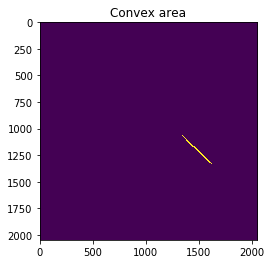

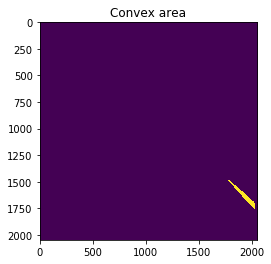

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w15.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w15.czi
(2, 2048, 2048)


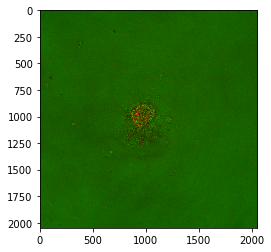

fitc
10 regions


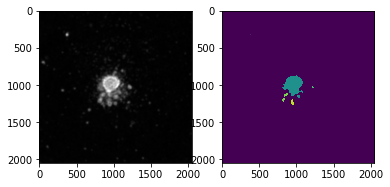

10 regions
2 regions after filtering using min size 150


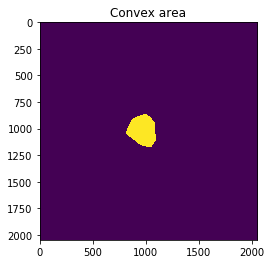

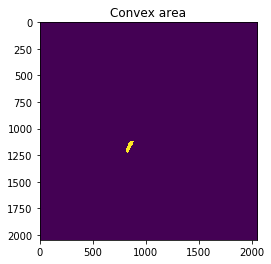

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w16.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w16.czi
(2, 2048, 2048)


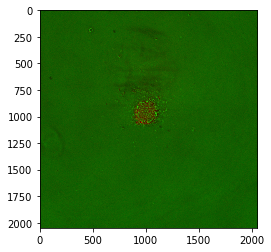

fitc
6 regions


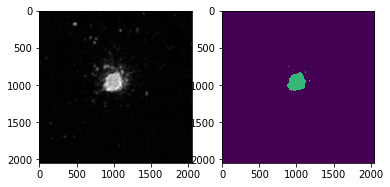

6 regions
1 regions after filtering using min size 150


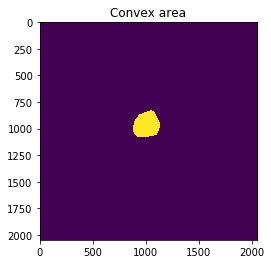

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w2.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w2.czi
(2, 2048, 2048)


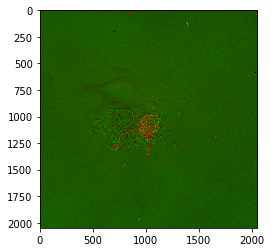

fitc
18 regions


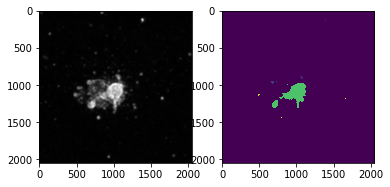

18 regions
1 regions after filtering using min size 150


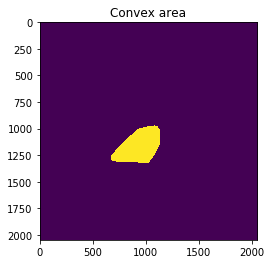

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w3.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w3.czi
(2, 2048, 2048)


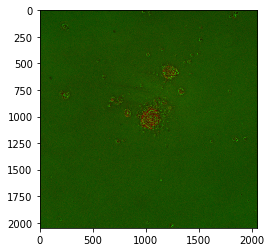

fitc
18 regions


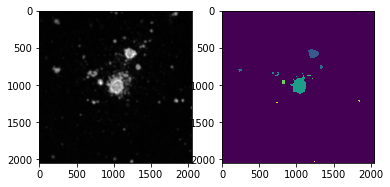

18 regions
1 regions after filtering using min size 150


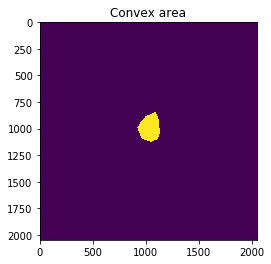

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w4.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w4.czi
(2, 2048, 2048)


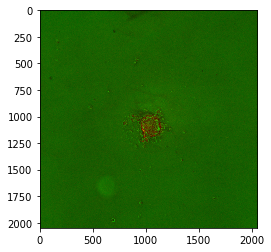

fitc
9 regions


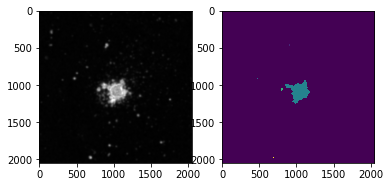

9 regions
1 regions after filtering using min size 150


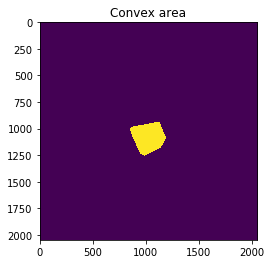

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w5.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w5.czi
(2, 2048, 2048)


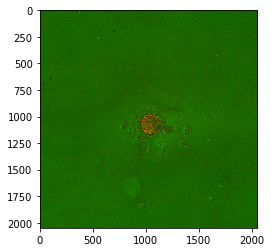

fitc
7 regions


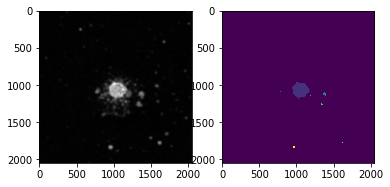

7 regions
1 regions after filtering using min size 150


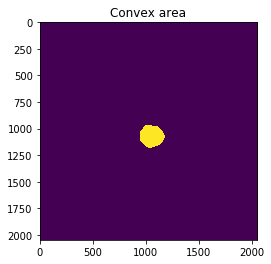

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w6.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w6.czi
(2, 2048, 2048)


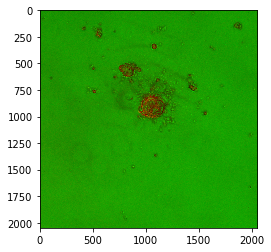

fitc
25 regions


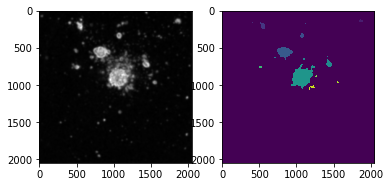

25 regions
2 regions after filtering using min size 150


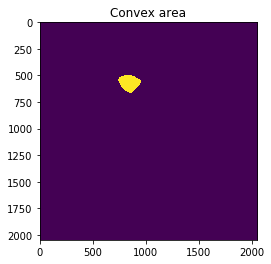

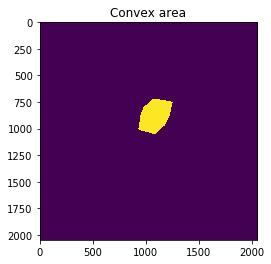

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w7.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w7.czi
(2, 2048, 2048)


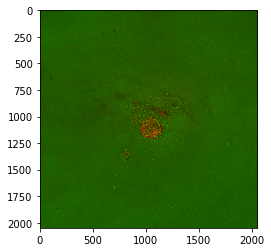

fitc
10 regions


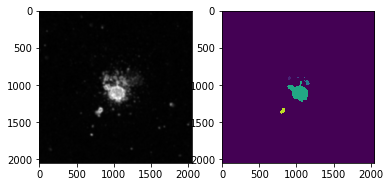

10 regions
1 regions after filtering using min size 150


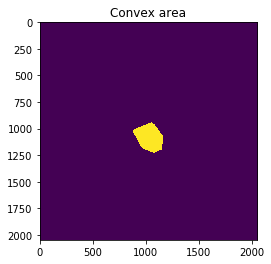

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w8.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w8.czi
(2, 2048, 2048)


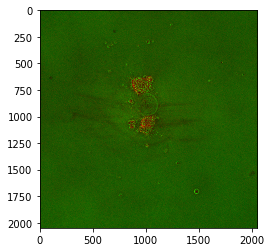

fitc
9 regions


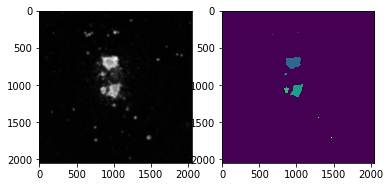

9 regions
2 regions after filtering using min size 150


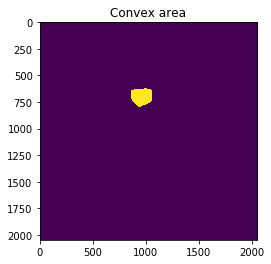

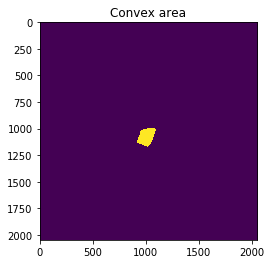

../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w9.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_48h/GFAP-GFP_her-dRFP_P4_96wells_10X_700-w9.czi
(2, 2048, 2048)


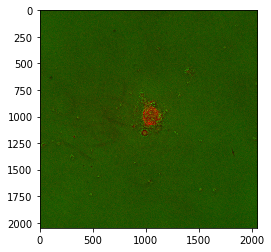

fitc
9 regions


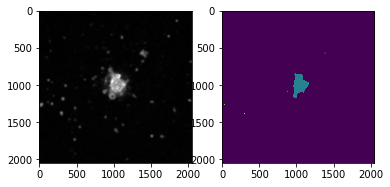

9 regions
1 regions after filtering using min size 150


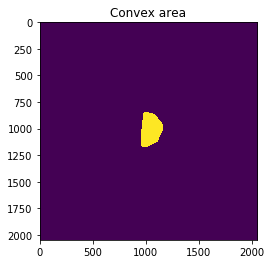

../data-Seb/Neurons/96-wells_2/96-wells_2_72h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w1.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_72h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w1.czi
(2, 2048, 2048)


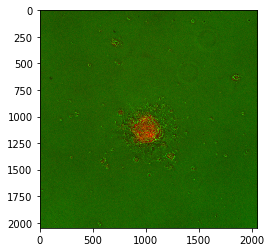

fitc
27 regions


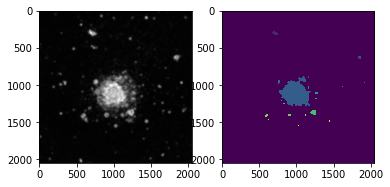

27 regions
1 regions after filtering using min size 150


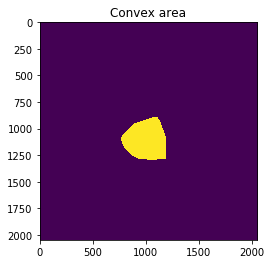

../data-Seb/Neurons/96-wells_2/96-wells_2_72h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w10.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_72h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w10.czi
(2, 2048, 2048)


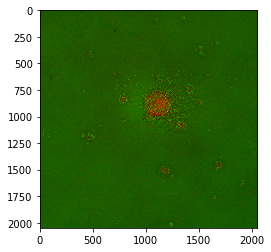

fitc
22 regions


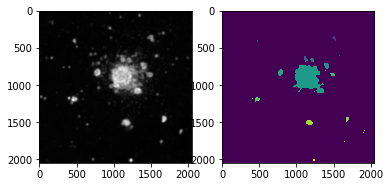

22 regions
1 regions after filtering using min size 150


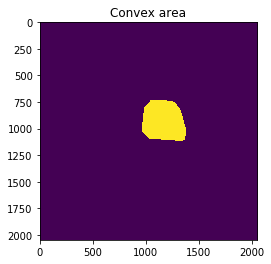

../data-Seb/Neurons/96-wells_2/96-wells_2_72h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w11.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_72h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w11.czi
(2, 2048, 2048)


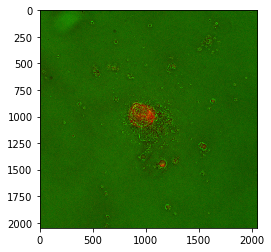

fitc
38 regions


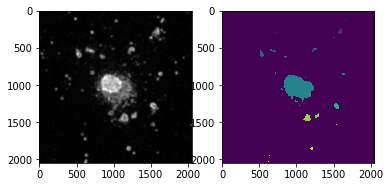

38 regions
1 regions after filtering using min size 150


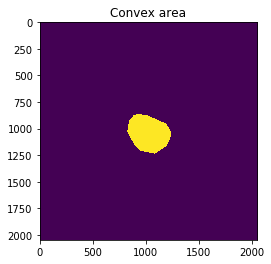

../data-Seb/Neurons/96-wells_2/96-wells_2_72h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w12.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_72h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w12.czi
(2, 2048, 2048)


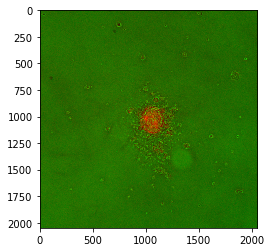

fitc
25 regions


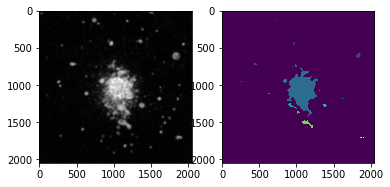

25 regions
2 regions after filtering using min size 150


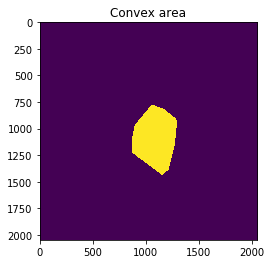

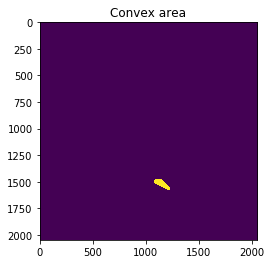

../data-Seb/Neurons/96-wells_2/96-wells_2_72h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w13.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_72h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w13.czi
(2, 2048, 2048)


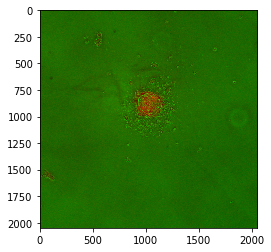

fitc
27 regions


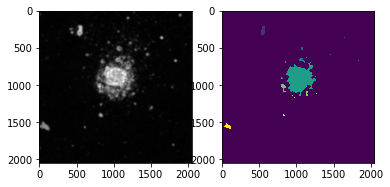

27 regions
1 regions after filtering using min size 150


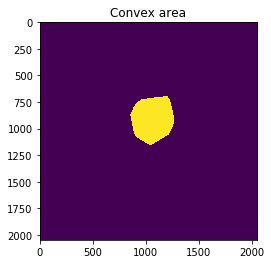

../data-Seb/Neurons/96-wells_2/96-wells_2_72h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w14.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_72h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w14.czi
(2, 2048, 2048)


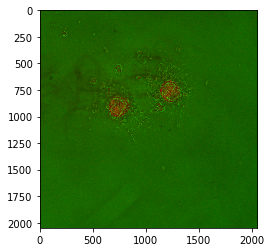

fitc
31 regions


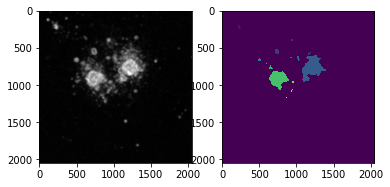

31 regions
2 regions after filtering using min size 150


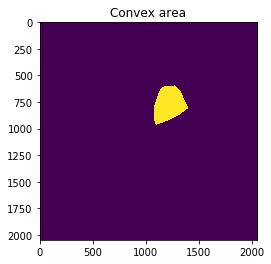

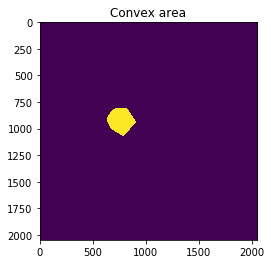

../data-Seb/Neurons/96-wells_2/96-wells_2_72h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w15.czi
../data-Seb/Neurons/96-wells_2/96-wells_2_72h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w15.czi
(2, 2048, 2048)


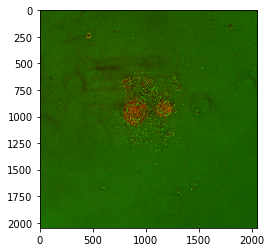

fitc


KeyboardInterrupt: 

In [151]:
results = pd.DataFrame()
for f in flist[:3]:
    print(f)
    age, cell_number, well = re.compile('(\d\dh).*_10X_(\d*)-(w\d*)').findall(f)[0]
    rgb = read_czi(f, plot=True)
    result = process_2_colors(rgb, plot=True, min_size=150, age=age, cell_number=cell_number, well=well)
    results = pd.concat((results, result))


In [159]:
results = pd.DataFrame()
for f in flist[:]:
    age, cell_number, well = re.compile('(\d\dh).*_10X_(\d*)-(w\d*)').findall(f)[0]
    rgb = read_czi(f, plot=False)
    result = process_2_colors(rgb, plot=False, min_size=150, age=age, cell_number=cell_number, well=well)
    results = pd.concat((results, result))


../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w1.czi
(2, 2048, 2048)
fitc
20 regions
20 regions
2 regions after filtering using min size 150
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w10.czi
(2, 2048, 2048)
fitc
21 regions
21 regions
1 regions after filtering using min size 150
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w11.czi
(2, 2048, 2048)
fitc
22 regions
22 regions
2 regions after filtering using min size 150
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w12.czi
(2, 2048, 2048)
fitc
26 regions
26 regions
1 regions after filtering using min size 150
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w13.czi
(2, 2048, 2048)
fitc
14 regions
14 regions
1 regions after filtering using min size 150
../data-Seb/Neurons/96-wells_2/96-wells_2_24h/GFAP-GFP_her-dRFP_P4_96wells_10X_1000-w14.czi
(2, 2048,

In [161]:
results

,path,size_px,area,perimeter,circularity,convex_area,convex_eccentricity,convex_perimeter,convex_circularity,tritc,fitc,index,age,cell_number,well
0,../data-Seb/Neurons/96-wells_2/96-wells_2_24h/...,407.031615,110955,1672.871283,0.039648,139048,0.419382,1444.528137,0.066637,847.693293,14795.159894,0,24h,1000,w1
1,../data-Seb/Neurons/96-wells_2/96-wells_2_24h/...,166.535767,7281,453.830519,0.035351,9789,0.857022,413.404112,0.057278,689.504648,15302.970579,1,24h,1000,w1
0,../data-Seb/Neurons/96-wells_2/96-wells_2_24h/...,442.988393,111899,1700.764681,0.038685,134156,0.606510,1464.437734,0.062556,777.385067,14685.146784,0,24h,1000,w10
0,../data-Seb/Neurons/96-wells_2/96-wells_2_24h/...,414.862071,111998,2099.495742,0.025409,150137,0.541964,1531.976839,0.063971,743.686180,14919.386554,0,24h,1000,w11
1,../data-Seb/Neurons/96-wells_2/96-wells_2_24h/...,178.979306,10206,458.960461,0.048451,11424,0.870173,447.244733,0.057112,782.834646,15092.914391,1,24h,1000,w11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1,../data-Seb/Neurons/96-wells_2/96-wells_2_72h/...,400.586304,87066,1778.387048,0.027529,116134,0.653342,1335.359523,0.065127,933.724318,15156.338704,1,72h,700,w6
0,../data-Seb/Neurons/96-wells_2/96-wells_2_72h/...,304.916790,36921,1351.734198,0.020206,50763,0.740619,888.038672,0.064370,905.301440,16119.591494,0,72h,700,w7
0,../data-Seb/Neurons/96-wells_2/96-wells_2_72h/...,195.175978,24309,673.511760,0.053589,27261,0.411202,644.558441,0.065617,937.081325,16254.181945,0,72h,700,w8
1,../data-Seb/Neurons/96-wells_2/96-wells_2_72h/...,192.983492,21518,686.281313,0.045688,25952,0.635465,625.972655,0.066231,865.710581,15298.073366,1,72h,700,w8


In [166]:
results['tritc/fitc'] = results.tritc / results.fitc
results['size_um'] = results.size_px * .65
results['circ'] = results.circularity * 4 * np.pi
results['conv_circ'] = results.convex_circularity * 4 * np.pi

data = results.query('size_px < 800')


In [163]:
def plot(data, x='age', y='fitc', hue='cell_number'):
    fig, ax = plt.subplots(dpi=150)
    ax.set_title(y.upper())

    sns.swarmplot(data=data, x=x, y=y, hue=hue, dodge=1)
    sns.boxplot(data=data, x=x, y=y, hue=hue, dodge=1, boxprops=dict(alpha=.3))
    plt.show()

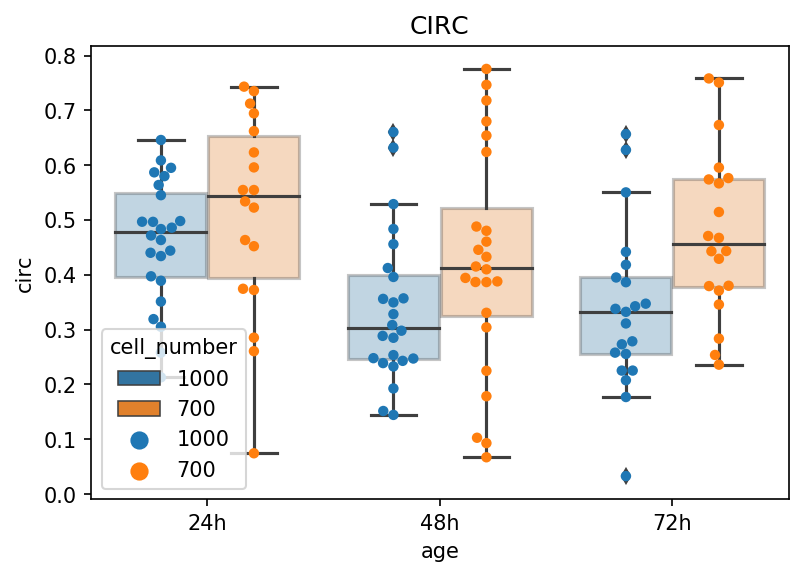

In [167]:
plot(data, y='circ')

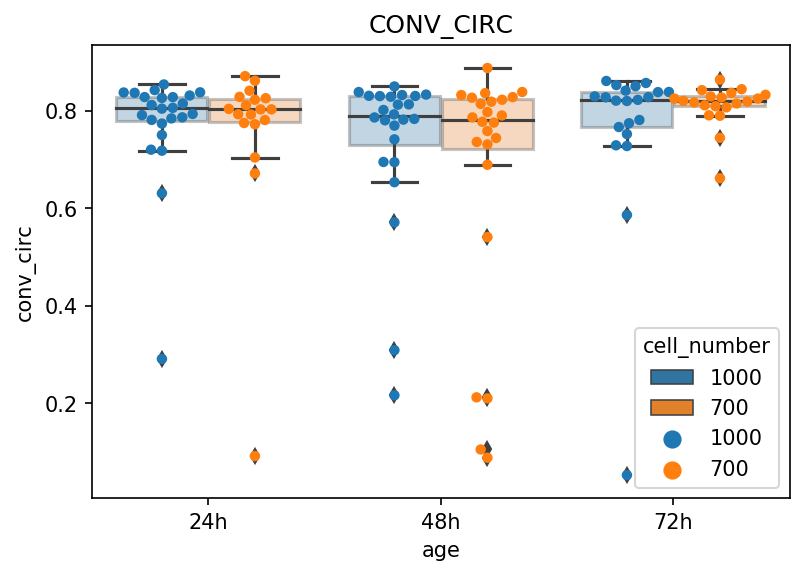

In [168]:
plot(data, y='conv_circ')

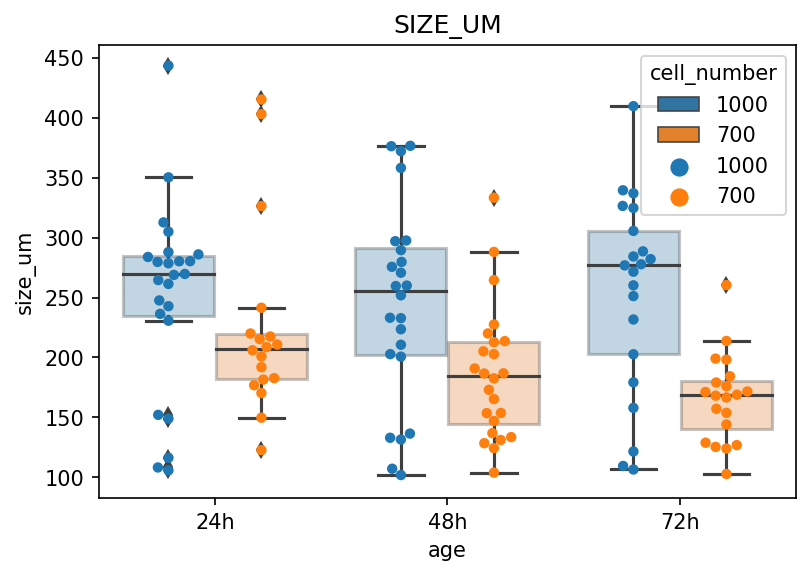

In [150]:

plot(data, y='size_um')

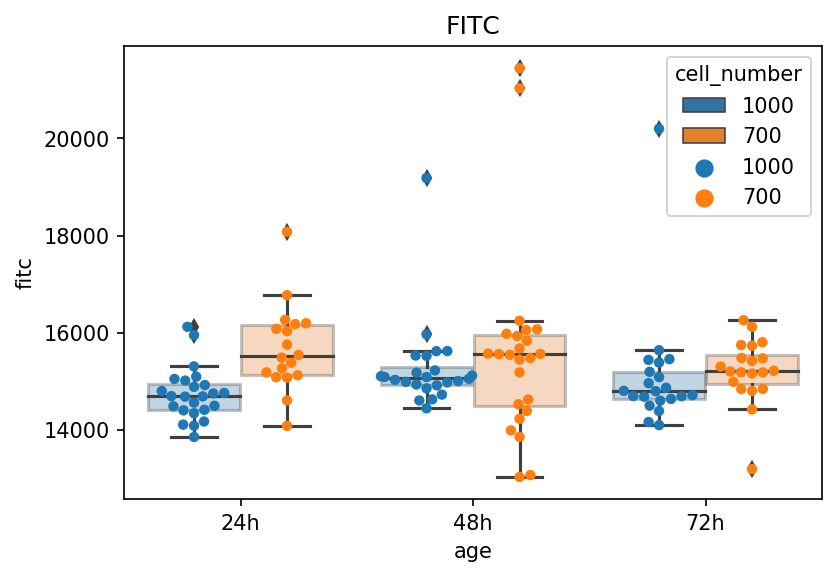

In [136]:
plot(data, y='fitc')

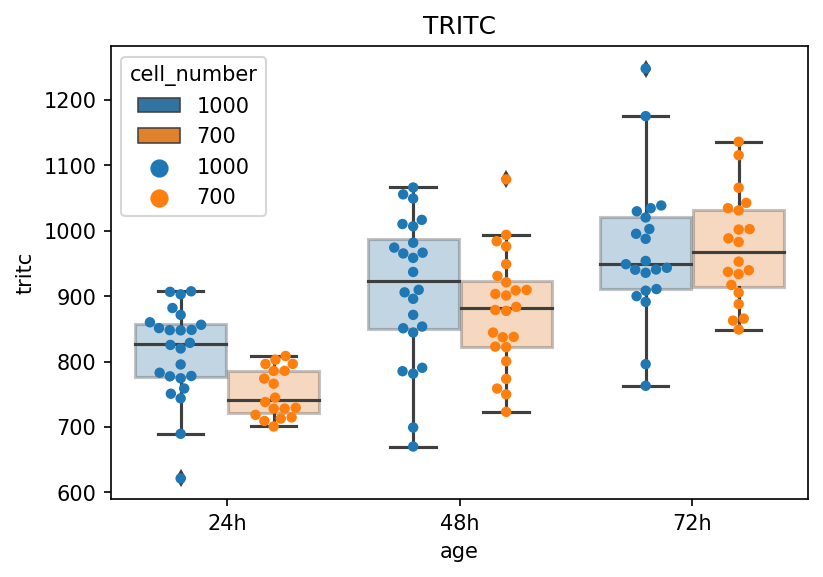

In [137]:
plot(data, y='tritc')

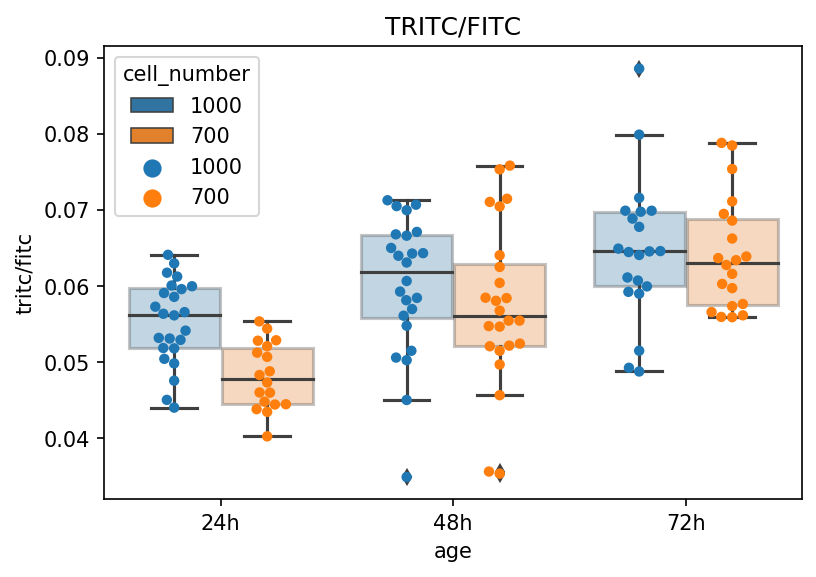

In [134]:
plot(data, y='tritc/fitc')